In [3]:
import numpy as np
import matplotlib.pyplot as plt
import IPython.display
import librosa
import librosa.display

In [4]:
# import required module
import os
# assign directory
directory = 'train_sound'
filename_list = []
 
# iterate over files in
# that directory
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    filename_list.append(f)
print(filename_list)
print(filename_list[0][12::])


['train_sound/E40.wav', 'train_sound/J07.wav', 'train_sound/J13.wav', 'train_sound/J12.wav', 'train_sound/J06.wav', 'train_sound/E41.wav', 'train_sound/E43.wav', 'train_sound/J38.wav', 'train_sound/J10.wav', 'train_sound/J04.wav', 'train_sound/J05.wav', 'train_sound/J11.wav', 'train_sound/J39.wav', 'train_sound/E42.wav', 'train_sound/.DS_Store', 'train_sound/J15.wav', 'train_sound/J01.wav', 'train_sound/J29.wav', 'train_sound/J28.wav', 'train_sound/J14.wav', 'train_sound/J02.wav', 'train_sound/J16.wav', 'train_sound/J17.wav', 'train_sound/J03.wav', 'train_sound/E44.wav', 'train_sound/E37.wav', 'train_sound/E23.wav', 'train_sound/E22.wav', 'train_sound/E36.wav', 'train_sound/E20.wav', 'train_sound/E34.wav', 'train_sound/E08.wav', 'train_sound/E09.wav', 'train_sound/E35.wav', 'train_sound/E21.wav', 'train_sound/E19.wav', 'train_sound/E25.wav', 'train_sound/E31.wav', 'train_sound/E30.wav', 'train_sound/E24.wav', 'train_sound/E18.wav', 'train_sound/E32.wav', 'train_sound/E26.wav', 'train_s

In [5]:
n_mels = 128

/var/folders/w8/gfbr5xsj52ldw3lcl2ndgl7c0000gn/T/ipykernel_68359/1917163710.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12,4))


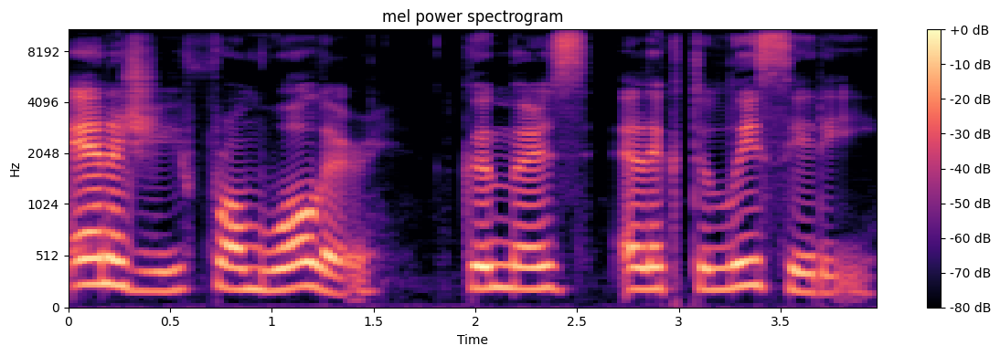

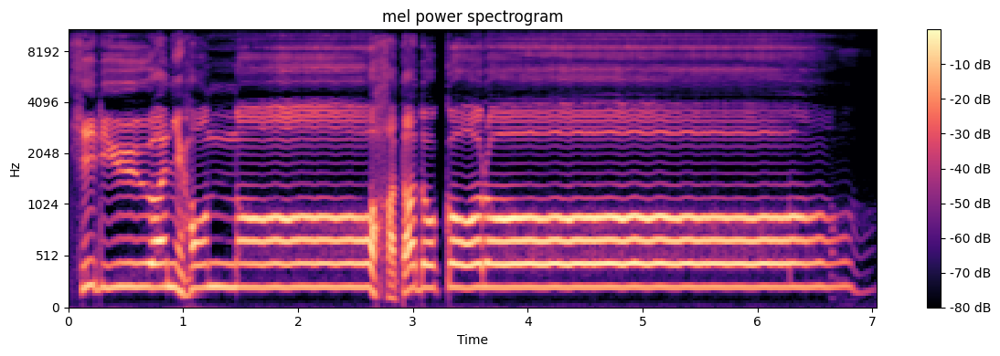

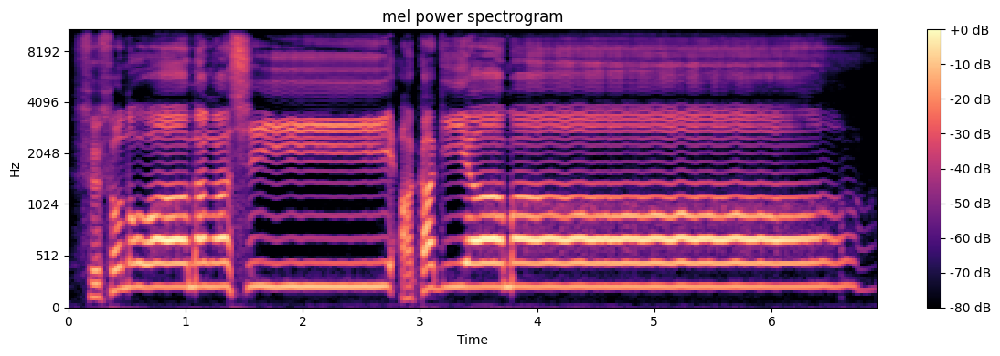

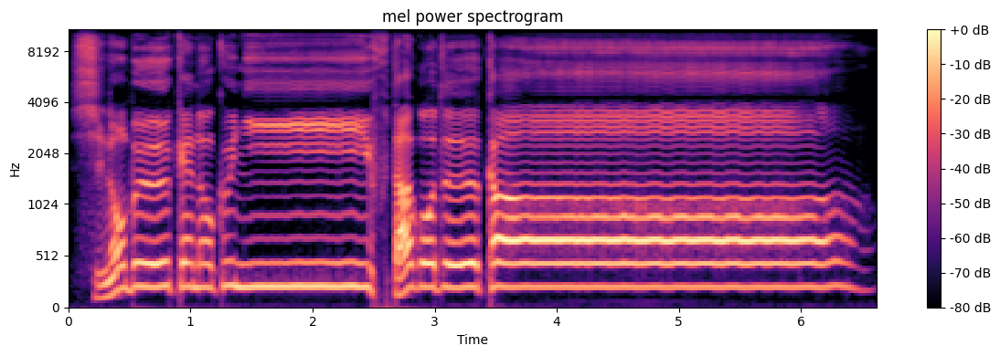

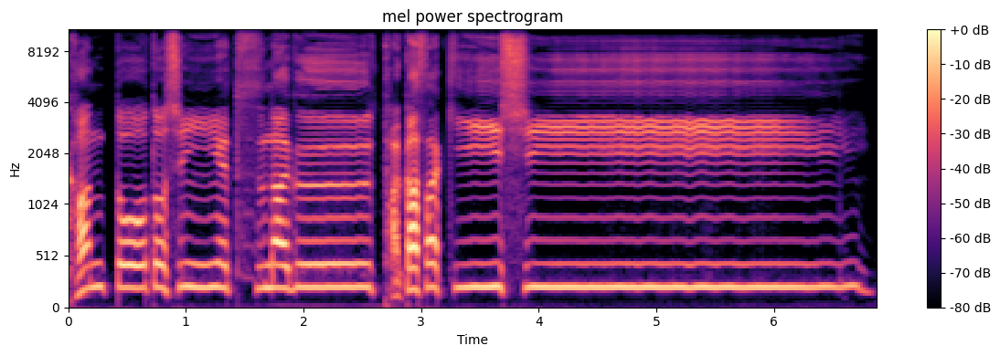

...

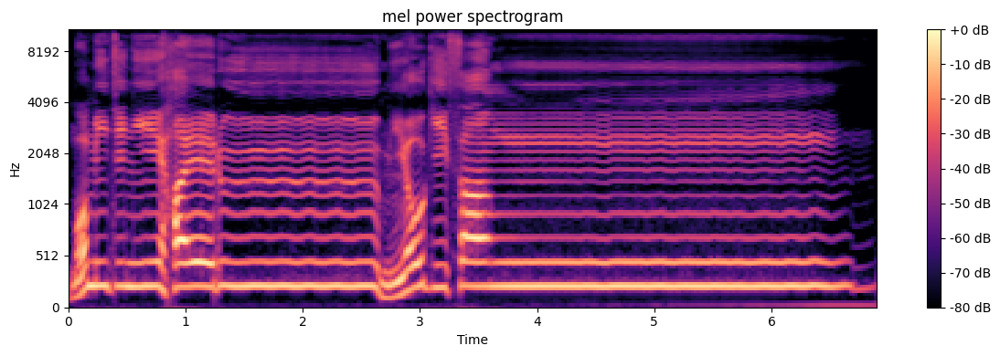

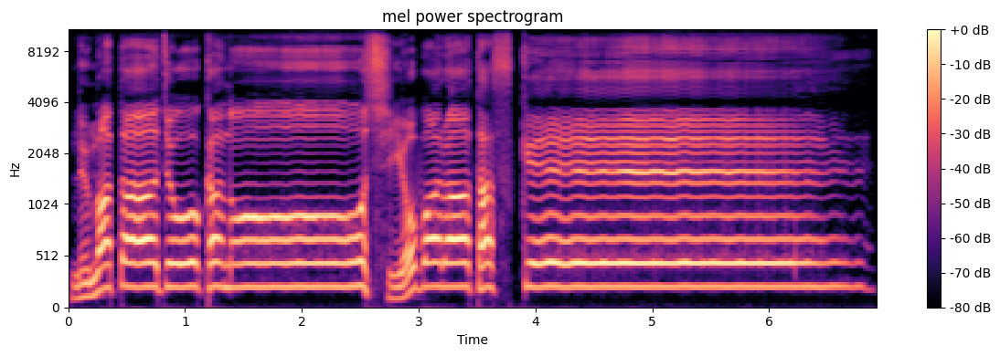

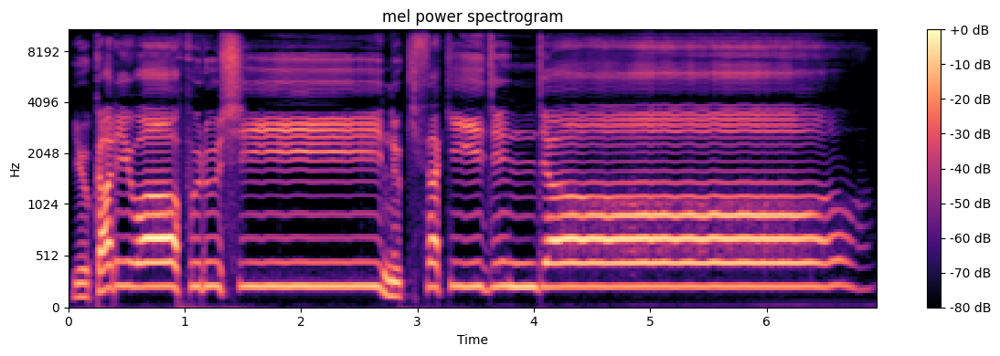

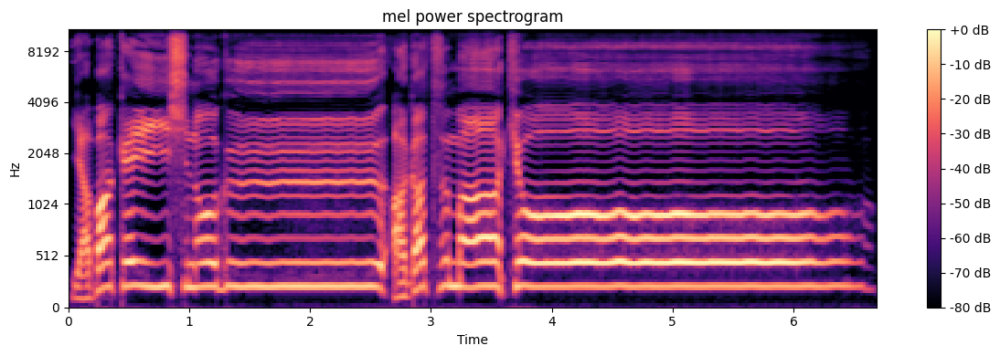

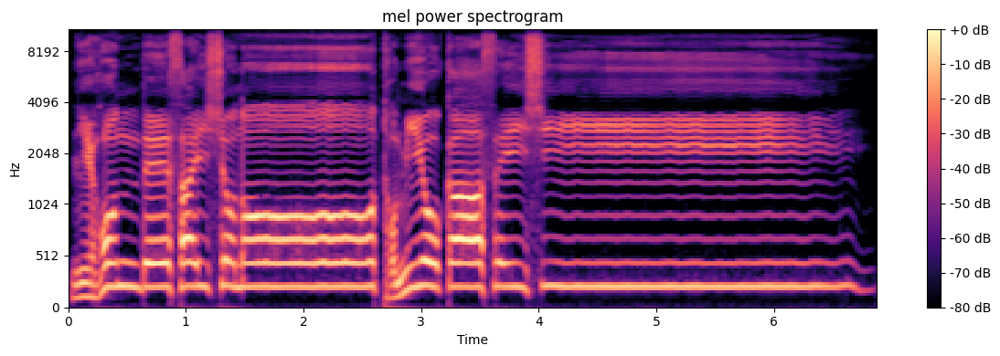

In [32]:
# For train sound files
for i in range(len(filename_list)):
    q, q_sr = librosa.load(filename_list[i])
    # Let's make and display a mel-scaled power (energy-squared) spectrogram
    S = librosa.feature.melspectrogram(q, sr=q_sr, n_mels=n_mels)

    # Convert to log scale (dB). We'll use the peak power as reference.
    log_S = librosa.power_to_db(S, ref=np.max)

    # Make a new figure
    plt.figure(figsize=(12,4))

    # Display the spectrogram on a mel scale
    # sample rate and hop length parameters are used to render the time axis
    librosa.display.specshow(log_S, sr=q_sr, x_axis='time', y_axis='mel')
    # print(log_S)

    # Put a descriptive title on the plot
    plt.title('mel power spectrogram')

    # draw a color bar
    plt.colorbar(format='%+02.0f dB')

    # Make the figure layout compact
    plt.tight_layout()
    plt.savefig("train_mel_img/"+filename_list[i][12:-4]+".png")

In [ ]:
# For train sound files
for i in range(len(filename_list)):
    q, q_sr = librosa.load(filename_list[i])
    # Let's make and display a mel-scaled power (energy-squared) spectrogram
    S = librosa.feature.melspectrogram(q, sr=q_sr, n_mels=128)

    # Convert to log scale (dB). We'll use the peak power as reference.
    log_S = librosa.power_to_db(S, ref=np.max)

    # Make a new figure
    plt.figure(figsize=(12,4))


In [ ]:

    # Display the spectrogram on a mel scale
    # sample rate and hop length parameters are used to render the time axis
    librosa.display.specshow(log_S, sr=q_sr, x_axis='time', y_axis='mel')
    # print(log_S)

    # Put a descriptive title on the plot
    plt.title('mel power spectrogram')

    # draw a color bar
    plt.colorbar(format='%+02.0f dB')

    # Make the figure layout compact
    plt.tight_layout()
    plt.savefig("train_mel_img/"+filename_list[i][12:-4]+".png")

In [ ]:
#for answer sound files

for i in range(len(filename_list)):
    q, q_sr = librosa.load(filename_list[i])
    # Let's make and display a mel-scaled power (energy-squared) spectrogram
    S = librosa.feature.melspectrogram(q, sr=q_sr, n_mels=128)

    # Convert to log scale (dB). We'll use the peak power as reference.
    log_S = librosa.power_to_db(S, ref=np.max)

    # Make a new figure
    plt.figure(figsize=(12,4))

    # Display the spectrogram on a mel scale
    # sample rate and hop length parameters are used to render the time axis
    librosa.display.specshow(log_S, sr=q_sr, x_axis='time', y_axis='mel')
    # print(log_S)

    # Put a descriptive title on the plot
    plt.title('mel power spectrogram')

    # draw a color bar
    plt.colorbar(format='%+02.0f dB')

    # Make the figure layout compact
    plt.tight_layout()
    plt.savefig("train_mel_img/"+filename_list[i][12:-4]+".png")

In [ ]:
# Machine Learning Part

In [15]:
import numpy as np
import librosa
import librosa.display
import tensorflow as tf
from tensorflow.keras import layers, models
import cv2

In [22]:
picname_list = []

for filename in os.listdir("train_mel_img"):
    f = os.path.join("train_mel_img", filename)
    picname_list.append(f)

In [36]:
txt = "train_mel_img/E21.png"
print(txt[-7:-4])

E21


In [41]:
train_path = 'train_mel_img/'
mixed_path = 'test_mel_img/'

# Load and preprocess individual sound Mel spectrograms
individual_sounds_path = [n for n in picname_list]  # List of individual sound Mel spectrograms
individual_sounds = [cv2.imread(image_path, cv2.IMREAD_GRAYSCALE) for image_path in individual_sounds_path]
labels = [n[-7:-4] for n in individual_sounds_path] 

# print(individual_sounds_path)
# print(individual_sounds)
# print(labels)            

# Load and preprocess mixed sound Mel spectrograms
mixed_sounds_path = []
mixed_sounds = []       # List of mixed sound Mel spectrograms
mixed_labels = []       # Labels indicating mixed sounds

for i in os.listdir(mixed_path):
    if i[0] == "E" or i[0] == "J" or i[0] == "M":
        for j in os.listdir(mixed_path+i):
            mixed_sounds_path.append(mixed_path+i+"/"+j)
            mixed_labels.append(i)

mixed_sounds = [cv2.imread(image_path, cv2.IMREAD_GRAYSCALE) for image_path in mixed_sounds_path]

# print(mixed_sounds_path)
# print(mixed_labels)
# print(mixed_sounds)

['test_mel_img/E01_E02_E03/8.png', 'test_mel_img/E01_E02_E03/7.png', 'test_mel_img/E01_E02_E03/6.png', 'test_mel_img/E01_E02_E03/2.png', 'test_mel_img/E01_E02_E03/1.png', 'test_mel_img/E01_E02_E03/0.png', 'test_mel_img/E01_E02_E03_E04_E05/8.png', 'test_mel_img/E01_E02_E03_E04_E05/9.png', 'test_mel_img/E01_E02_E03_E04_E05/11.png', 'test_mel_img/E01_E02_E03_E04_E05/10.png', 'test_mel_img/E01_E02_E03_E04_E05/7.png', 'test_mel_img/E01_E02_E03_E04_E05/6.png', 'test_mel_img/E01_E02_E03_E04_E05/2.png', 'test_mel_img/E01_E02_E03_E04_E05/3.png', 'test_mel_img/E01_E02_E03_E04_E05/1.png', 'test_mel_img/E01_E02_E03_E04_E05/0.png']
['E01_E02_E03', 'E01_E02_E03', 'E01_E02_E03', 'E01_E02_E03', 'E01_E02_E03', 'E01_E02_E03', 'E01_E02_E03_E04_E05', 'E01_E02_E03_E04_E05', 'E01_E02_E03_E04_E05', 'E01_E02_E03_E04_E05', 'E01_E02_E03_E04_E05', 'E01_E02_E03_E04_E05', 'E01_E02_E03_E04_E05', 'E01_E02_E03_E04_E05', 'E01_E02_E03_E04_E05', 'E01_E02_E03_E04_E05']
[array([[255, 255, 255, ..., 255, 255, 255],
       

In [78]:
num_classes = len(set(mixed_labels))
time_steps = 128


In [83]:
# Define the desired dimensions for spectrograms
desired_mels = 400
desired_time_steps = 882

# Declare 'all_sounds' and 'all_labels'
all_sounds = individual_sounds + mixed_sounds
all_labels = labels + mixed_labels

# Initialize a list to store the fixed spectrograms
fixed_sounds = []

# Iterate through your existing spectrograms and fix their shape
for sound in all_sounds:
    if sound is not None:  # Check if 'sound' is not None
        mel_bins, time_steps = sound.shape

        if time_steps < desired_time_steps:
            # Pad with zeros to the right to match the desired time steps
            padding = ((0, 0), (0, desired_time_steps - time_steps))
            fixed_sound = np.pad(sound, padding, mode='constant')
        elif time_steps > desired_time_steps:
            # Truncate to the desired time steps
            fixed_sound = sound[:, :desired_time_steps]
        else:
            # Spectrogram is already the desired shape
            fixed_sound = sound

        # Append the fixed spectrogram to the list
        fixed_sounds.append(fixed_sound)

# Shuffle the data
combined_data = list(zip(fixed_sounds, all_labels))
np.random.shuffle(combined_data)
fixed_sounds, all_labels = zip(*combined_data)

# Split the data into training, validation, and test sets
split_ratio = [0.7, 0.15, 0.15]
split_index = [int(len(fixed_sounds) * ratio) for ratio in split_ratio]

train_sounds = np.array(fixed_sounds[:split_index[0]])
train_labels = np.array(all_labels[:split_index[0]])
train_sounds = tf.convert_to_tensor(train_sounds, dtype=tf.float32)

# Define a custom label encoding function to handle unknown labels gracefully
def custom_encode_labels(encoder, labels):
    encoded_labels = []
    for label in labels:
        if label in encoder.classes_:
            encoded_labels.append(encoder.transform([label])[0])
        else:
            # Handle unknown labels gracefully (e.g., assign a special code like -1)
            encoded_labels.append(-1)  # You can choose a different code if needed
    return encoded_labels

label_encoder = LabelEncoder()
train_labels_encoded = label_encoder.fit_transform(train_labels)

val_sounds = np.array(fixed_sounds[split_index[0]:split_index[0] + split_index[1]])
val_labels = np.array(all_labels[split_index[0]:split_index[0] + split_index[1]])
val_sounds = tf.convert_to_tensor(val_sounds, dtype=tf.float32)

# Transform the validation labels using the custom encoding function
val_labels_encoded = custom_encode_labels(label_encoder, val_labels)

test_sounds = np.array(fixed_sounds[split_index[0] + split_index[1]:])
test_labels = np.array(all_labels[split_index[0] + split_index[1]:])

# Define a simple CNN model with the input shape matching the spectrogram shape
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(desired_mels, desired_time_steps, 1)),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
print(train_sounds)
print(train_labels_encoded)
print(val_sounds)
print(val_labels_encoded)
# Train the model
model.fit(train_sounds, train_labels_encoded, epochs=10, validation_data=(val_sounds, val_labels_encoded))

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(test_sounds, test_labels)
print("Test accuracy:", test_acc)


tf.Tensor(
[[[255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]
  ...
  [255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]]

 [[255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]
  ...
  [255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]]

 [[255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]
  ...
  [255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]]

 ...

 [[255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]
  ...
  [255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]
  [255. 255. 255. ... 255. 255. 255.]]

 [[255. 255. 255. ... 255. 255. 255.]
 

ValueError: in user code:

    File "/opt/homebrew/lib/python3.9/site-packages/keras/src/engine/training.py", line 1338, in train_function  *
        return step_function(self, iterator)
    File "/opt/homebrew/lib/python3.9/site-packages/keras/src/engine/training.py", line 1322, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/opt/homebrew/lib/python3.9/site-packages/keras/src/engine/training.py", line 1303, in run_step  **
        outputs = model.train_step(data)
    File "/opt/homebrew/lib/python3.9/site-packages/keras/src/engine/training.py", line 1081, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "/opt/homebrew/lib/python3.9/site-packages/keras/src/engine/training.py", line 1139, in compute_loss
        return self.compiled_loss(
    File "/opt/homebrew/lib/python3.9/site-packages/keras/src/engine/compile_utils.py", line 265, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "/opt/homebrew/lib/python3.9/site-packages/keras/src/losses.py", line 142, in __call__
        losses = call_fn(y_true, y_pred)
    File "/opt/homebrew/lib/python3.9/site-packages/keras/src/losses.py", line 268, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "/opt/homebrew/lib/python3.9/site-packages/keras/src/losses.py", line 2122, in categorical_crossentropy
        return backend.categorical_crossentropy(
    File "/opt/homebrew/lib/python3.9/site-packages/keras/src/backend.py", line 5560, in categorical_crossentropy
        target.shape.assert_is_compatible_with(output.shape)

    ValueError: Shapes (None, 1) and (None, 2) are incompatible


In [79]:
for sound in train_sounds:
    print(sound.shape)

    # Assuming train_sounds is a list of Mel spectrograms
    max_time_steps = max(sound.shape[1] for sound in train_sounds)
    consistent_train_sounds = []
    for sound in train_sounds:
        # Pad or truncate each spectrogram to the max_time_steps
        if sound.shape[1] < max_time_steps:
            sound = np.pad(sound, ((0, 0), (0, max_time_steps - sound.shape[1])), mode='constant')
        elif sound.shape[1] > max_time_steps:
            sound = sound[:, :max_time_steps]
        consistent_train_sounds.append(sound)

    # Convert the consistent_train_sounds list to a NumPy array
    train_sounds_new = np.array(consistent_train_sounds)



(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
(400, 882)
